In [1]:
pip install plotly pip install cufflinks


  Created wheel for cufflinks: filename=cufflinks-0.17.3-py3-none-any.whl size=68736 sha256=2809f5b961b2c8007380ac3cbe3da51e52ceb731112c8002c1c4da504b196ad7
  Stored in directory: c:\users\ashesh\appdata\local\pip\cache\wheels\29\b4\f8\2fd2206eeeba6ccad8167e4e8894b8c4ec27bf1342037fd136
Successfully built cufflinks


In [3]:
pip install chart_studio

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import chart_studio.plotly as py
import cufflinks as cf
import seaborn as sns
import plotly.express as px
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

## Basics

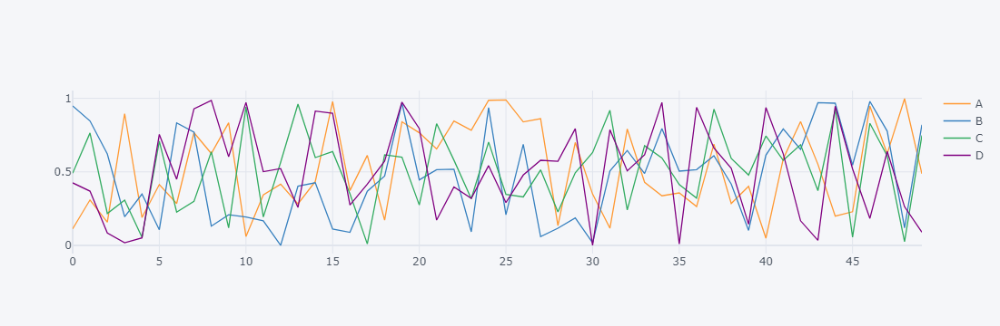

In [3]:
arr_1=np.random.rand(50,4)
df_1=pd.DataFrame(arr_1, columns=['A','B','C','D'])
df_1.head()
# df_1.plot()
df_1.iplot()

## Line Plots

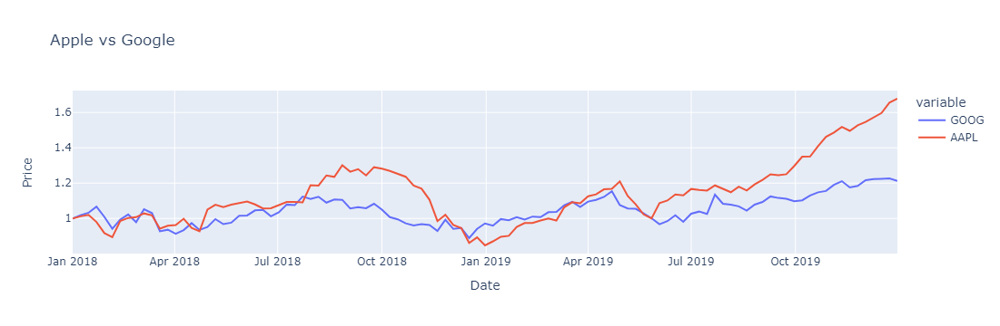

In [4]:
import plotly.graph_objects as go
df_stocks= px.data.stocks()                 #built in data package in plotly
px.line(df_stocks,x='date',y=['GOOG','AAPL'], labels={'date':'Date' , 'value':'Price'}, title= 'Apple vs Google')


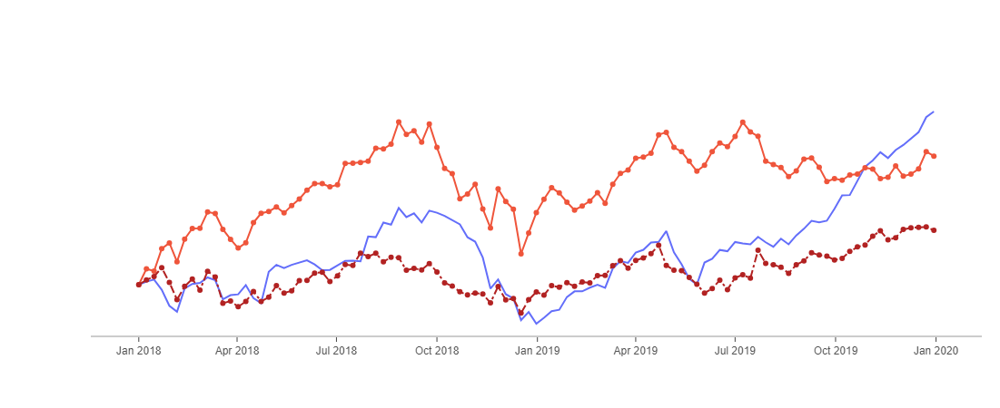

In [59]:
fig= go.Figure()
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, mode='lines', name='Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, mode='lines+markers', name='Amazon'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, mode='lines+markers', name='Google', line=dict(color='firebrick', width=2, dash='dashdot')))

# fig.update_layout(title='Stock Price Data 2018-2020', xaxis_title='Date', yaxis_title='Price')

fig.update_layout(
xaxis=dict(
showline=True, showgrid=False, showticklabels=True,
linecolor='rgb(204, 204, 204)',
linewidth=2, ticks='outside', tickfont=dict(family='Arial', size=12, color='rgb(82,82,82)',),    
),
yaxis=dict(showgrid=False, zeroline=False, showline=False, showticklabels=False),
autosize=False,
margin=dict(autoexpand=False, l=100, r=20, t=110,),
showlegend=False, plot_bgcolor='white'    
)

## Bar Charts

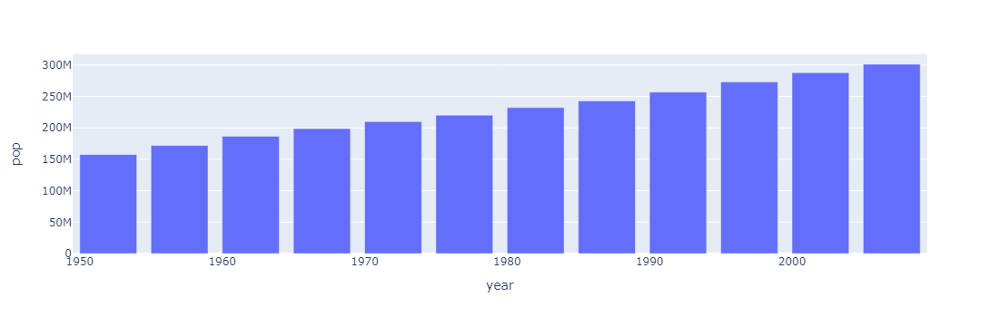

In [43]:
df_us= px.data.gapminder().query("country== 'United States'")
# df_us.head()
px.bar(df_us, x='year', y='pop')


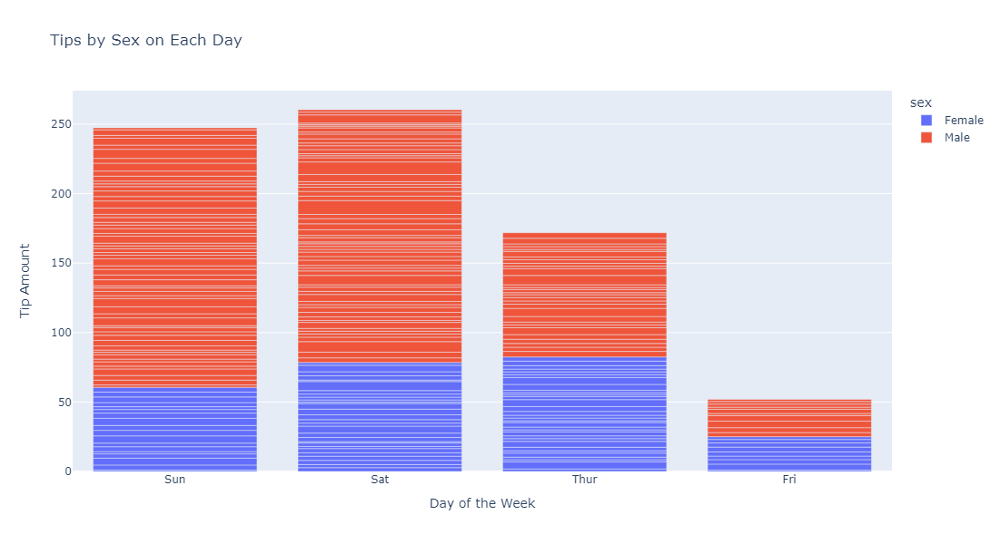

In [56]:
# Create a stacked bar with more customization
df_tips=px.data.tips()
fig=px.bar(df_tips, x='day', y='tip', color='sex', title='Tips by Sex on Each Day', labels={'tip':'Tip Amount', 'day': 'Day of the Week'})
fig.update_layout(
    width=800,
    height=600
)

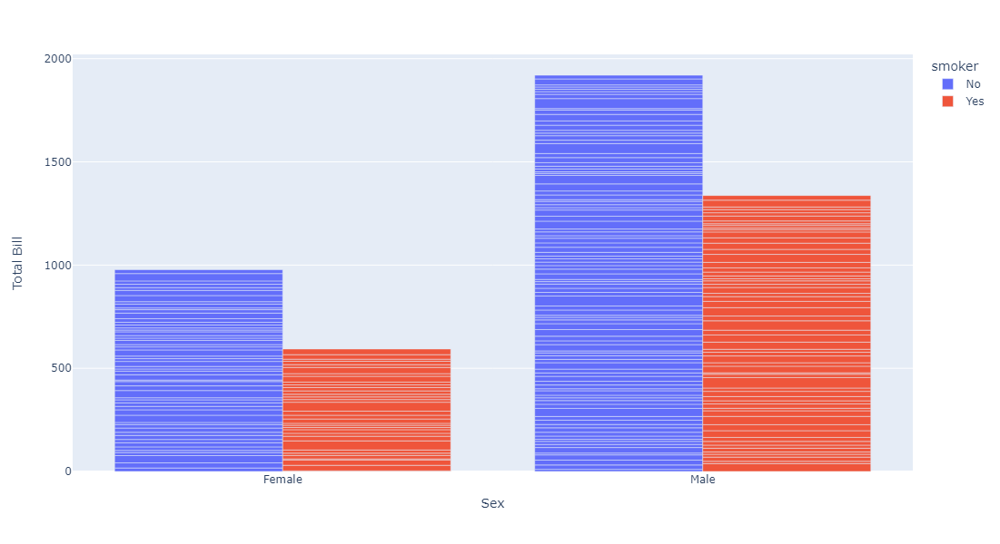

In [55]:
# Place bars next to each other
fig=px.bar(df_tips, x="sex", y="total_bill",
             color='smoker', barmode='group', labels={'sex':'Sex', 'total_bill': 'Total Bill'})
fig.update_layout(
    width=800,
    height=600
)

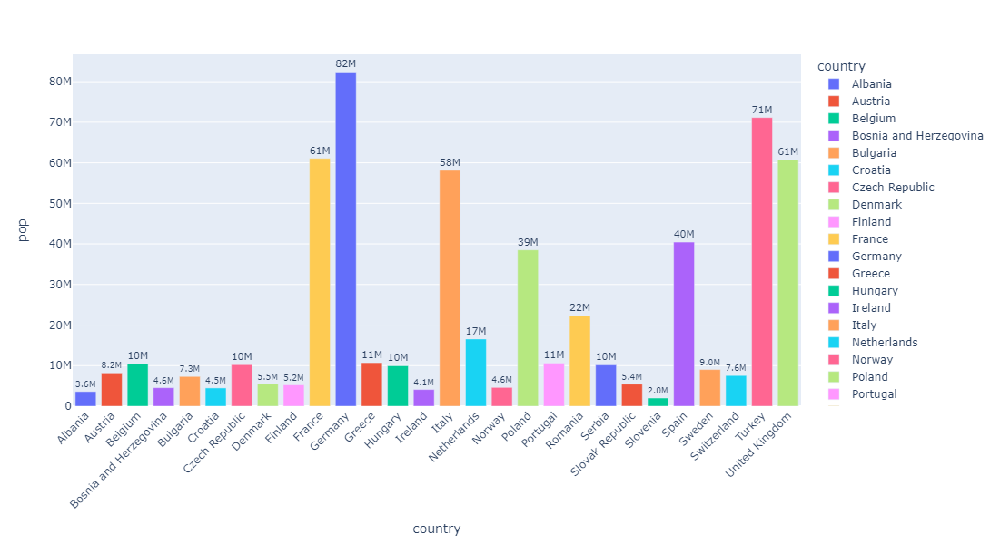

In [6]:
# Display pop data for countries in Europe in 2007 greater than 2000000
df_europe = px.data.gapminder().query("continent == 'Europe' and year == 2007 and pop > 2.e6")
fig = px.bar(df_europe, y='pop', x='country', text='pop', color='country')

# Put bar total value above bars with 2 values of precision
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
# Set fontsize and uniformtext_mode='hide' says to hide the text if it won't fit
fig.update_layout(uniformtext_minsize=8)
# Rotate labels 45 degrees
fig.update_layout(xaxis_tickangle=-45)

fig.update_layout(
    width=800,
    height=600
)
fig

## Scatter Plots

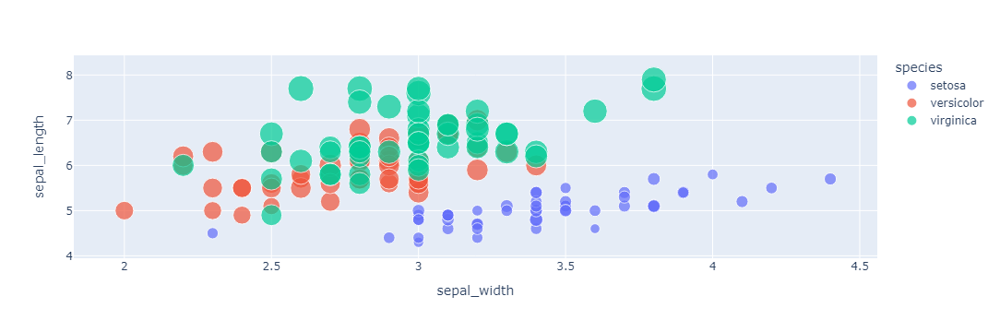

In [64]:
# Use included Iris data set
df_iris = px.data.iris()
# Create a scatter plot by defining x, y, different color for count of provided
# column, size based on supplied column and additional data to display on hover
px.scatter(df_iris, x="sepal_width", y="sepal_length", color="species",
                 size='petal_length', hover_data=['petal_width'])

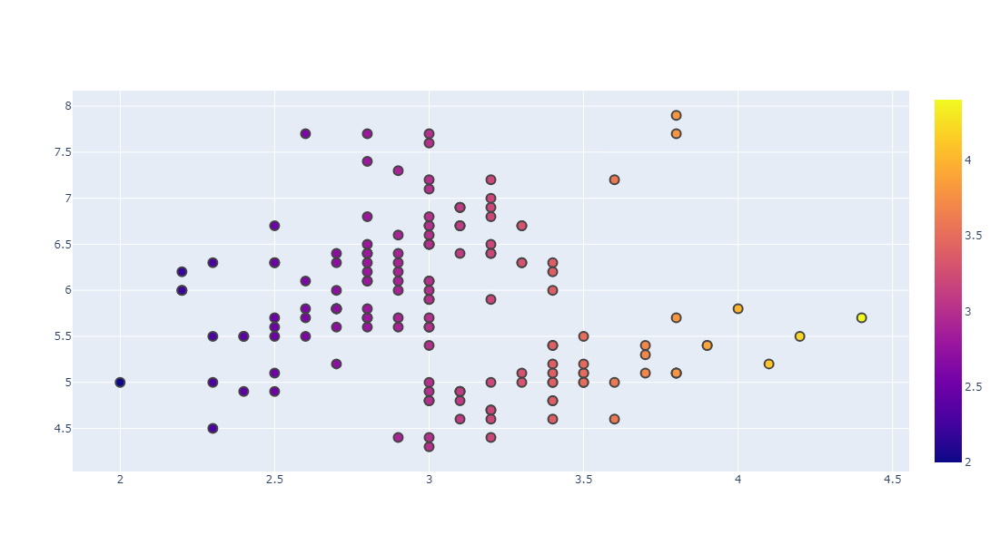

In [66]:
# Create a customized scatter with black marker edges with line width 2, opaque
# and colored based on width. Also show a scale on the right
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df_iris.sepal_width, y=df_iris.sepal_length,
    mode='markers',
    marker_color=df_iris.sepal_width,
    text=df_iris.species,
    marker=dict(showscale=True)
))
fig.update_traces(marker_line_width=2, marker_size=10)
fig.update_layout(
    width=800,
    height=600
)
fig

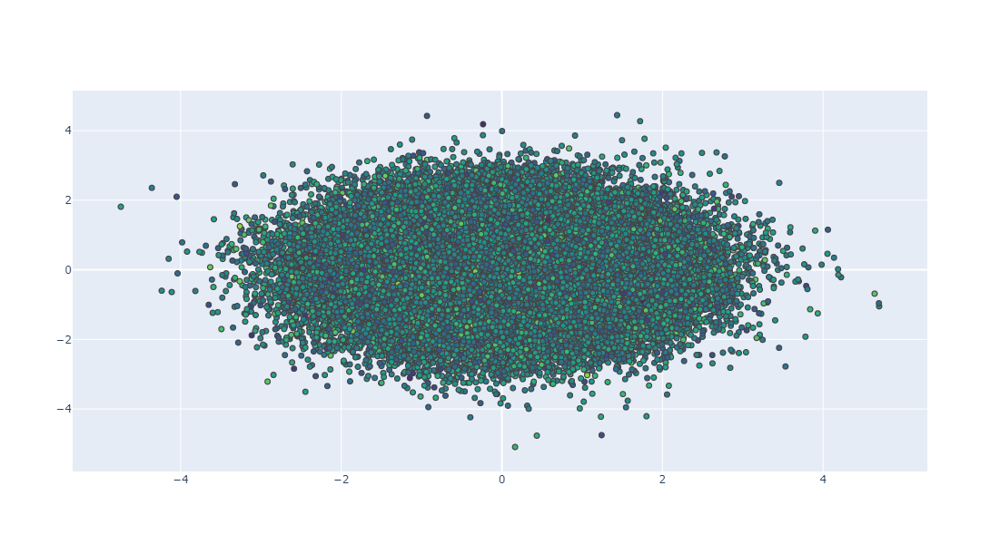

In [69]:
# Working with a lot of data use Scattergl
fig = go.Figure(data=go.Scattergl(
    x = np.random.randn(100000),
    y = np.random.randn(100000),
    mode='markers',
    marker=dict(
        color=np.random.randn(100000),
        colorscale='Viridis',
        line_width=1
    )
))
fig.update_layout(
    width=800,
    height=600
)
fig

## Pie Charts

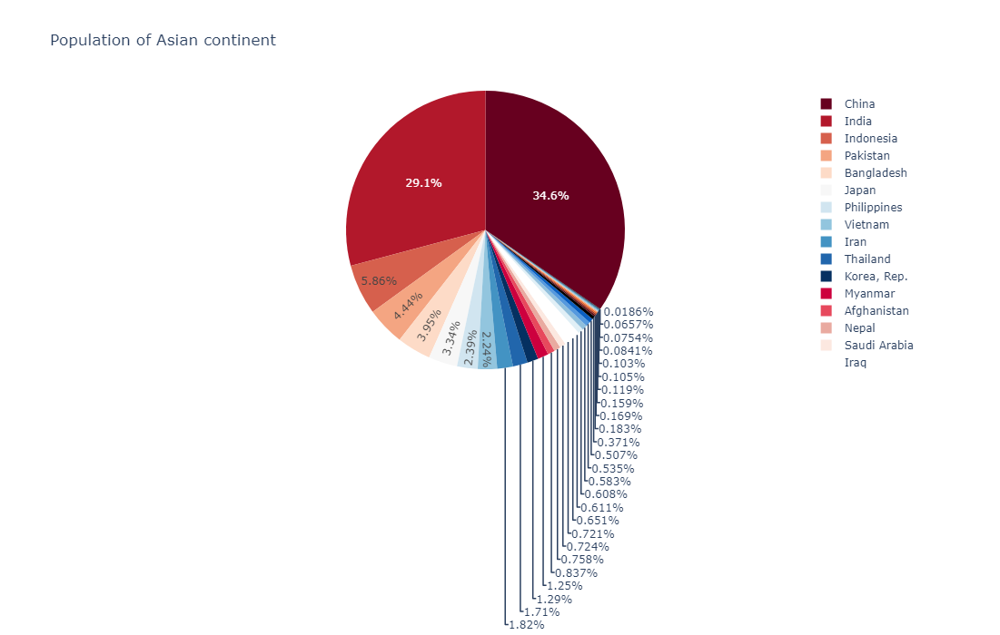

In [76]:
# Create Pie chart of the largest nations in Asia
# Color maps here plotly.com/python/builtin-colorscales/
df_asia = px.data.gapminder().query("year==2007").query("continent=='Asia'")
fig=px.pie(df_asia, values='pop', names='country', 
       title='Population of Asian continent', 
       color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_layout(width=800,height=700)
fig

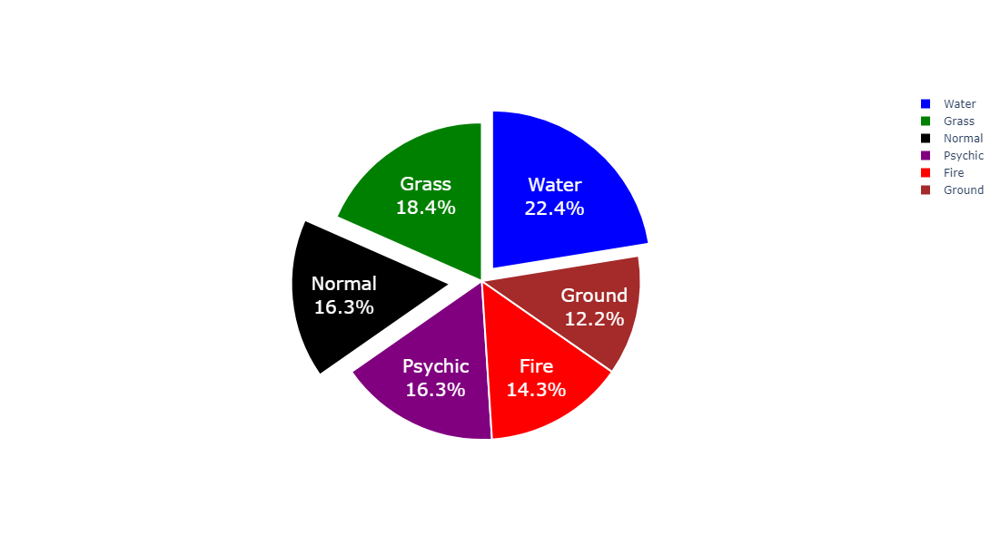

In [7]:
# Customize pie chart
colors = ['blue', 'green', 'black', 'purple', 'red', 'brown']
fig = go.Figure(data=[go.Pie(labels=['Water','Grass','Normal','Psychic', 'Fire', 'Ground'], 
                       values=[110,90,80,80,70,60])])

# Define hover info, text size, pull amount for each pie slice, and stroke
fig.update_traces(hoverinfo='label+percent', textfont_size=20,
                  textinfo='label+percent', pull=[0.1, 0, 0.2, 0, 0, 0],
                  marker=dict(colors=colors, line=dict(color='#FFFFFF', width=2)))
fig.update_layout(width=800,height=600)
fig

## Histogram

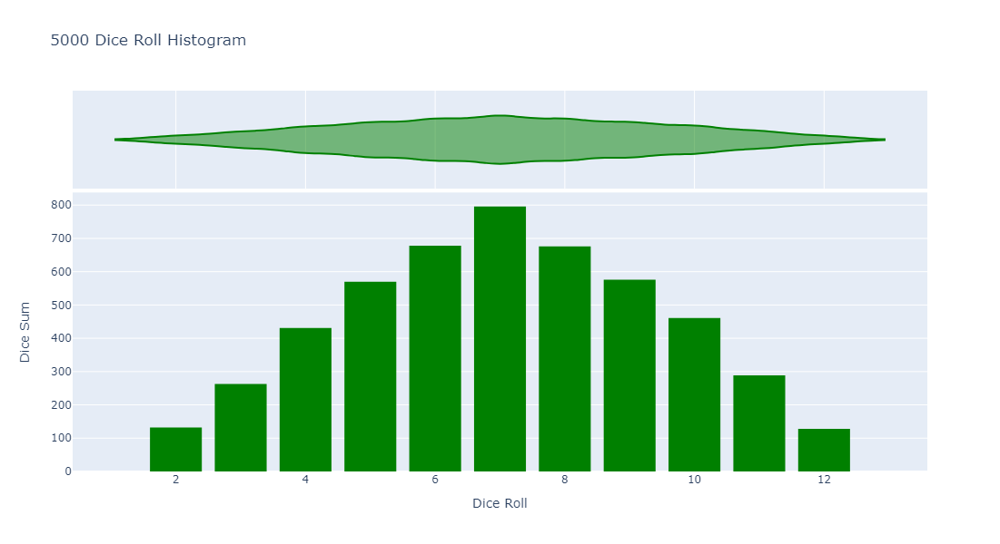

In [83]:
# Plot histogram based on rolling 2 dice
dice_1 = np.random.randint(1,7,5000)
dice_2 = np.random.randint(1,7,5000)
dice_sum = dice_1 + dice_2
# bins represent the number of bars to make
# Can define x label, color, title
# marginal creates another plot (violin, box, rug)
fig = px.histogram(dice_sum, nbins=11, labels={'value':'Dice Roll'},
             title='5000 Dice Roll Histogram', marginal='violin',
            color_discrete_sequence=['green'])

fig.update_layout(
    xaxis_title_text='Dice Roll',
    yaxis_title_text='Dice Sum',
    bargap=0.2, showlegend=False
)
fig.update_layout(width=800,height=600)

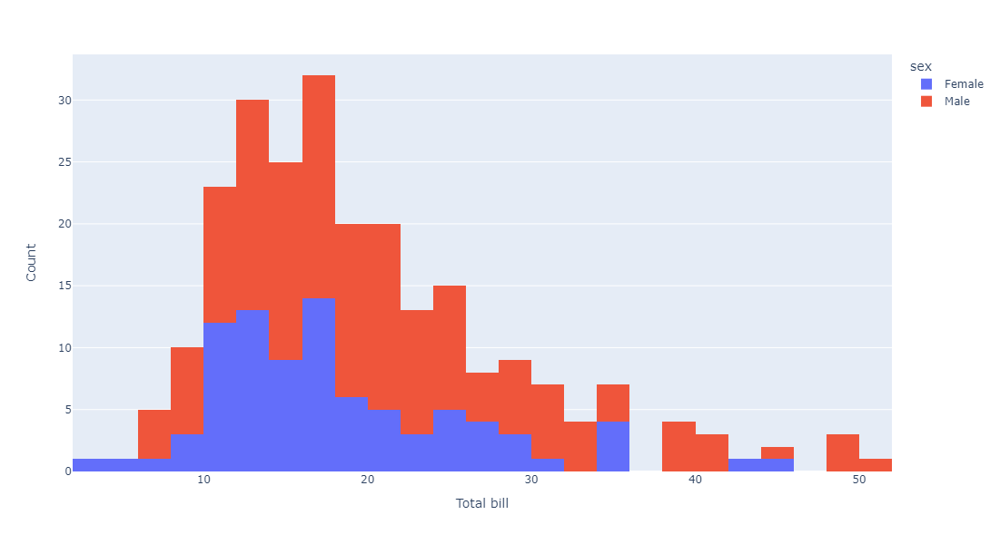

In [86]:
# Stack histograms based on different column data
df_tips = px.data.tips()
fig=px.histogram(df_tips, x="total_bill", color="sex")
fig.update_layout(
    xaxis_title_text='Total bill',
    yaxis_title_text='Count'
)    
fig.update_layout(width=800,height=600)

## Box Plots
A box plot, also known as a box-and-whisker plot, is a graphical representation of a dataset's distribution. It displays key statistical information about the distribution, including the median, quartiles, and potential outliers. Here's how a box plot is constructed and what each component represents:

Median (Q2): The line inside the box represents the median value of the dataset, which is the middle value when the data is sorted in ascending order.

Box (Interquartile Range, IQR): The box extends from the first quartile (Q1) to the third quartile (Q3), representing the middle 50% of the data. The length of the box is the interquartile range (IQR), which gives a measure of how spread out the middle portion of the data is.

Whiskers: The whiskers extend from the edges of the box to the smallest and largest values within a certain distance from the quartiles. By default, this distance is often set to 1.5 times the IQR. Data points beyond the whiskers are considered outliers and are typically plotted individually.

Outliers: Individual data points that fall outside the whiskers are marked as outliers. They can provide insight into potentially unusual or extreme values in the dataset.

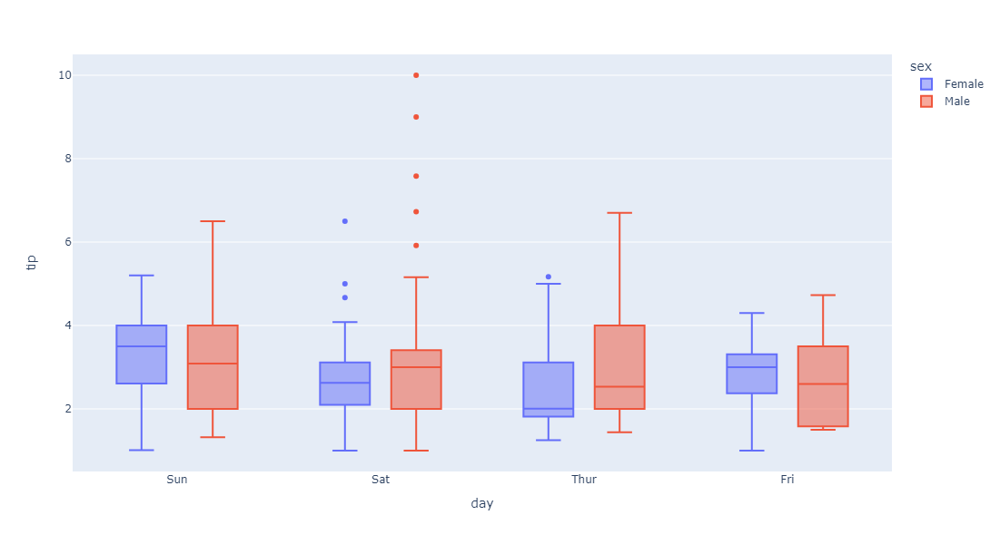

In [10]:
# A box plot allows you to compare different variables
# The box shows the quartiles of the data. The bar in the middle is the median 
# The whiskers extend to all the other data aside from the points that are considered to be outliers
df_tips = px.data.tips()
# Display tip sex data by day
fig=px.box(df_tips, x='day', y='tip', color='sex')
fig.update_layout(width=800,height=600)

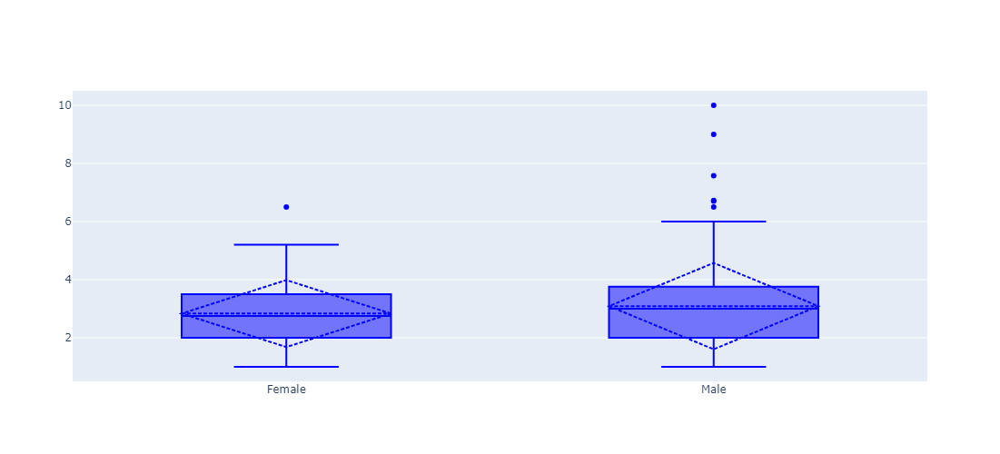

In [91]:
# Adding standard deviation and mean
fig = go.Figure()
fig.add_trace(go.Box(x=df_tips.sex, y=df_tips.tip, marker_color='blue',
                    boxmean='sd'))
fig.update_layout(width=800,height=500)

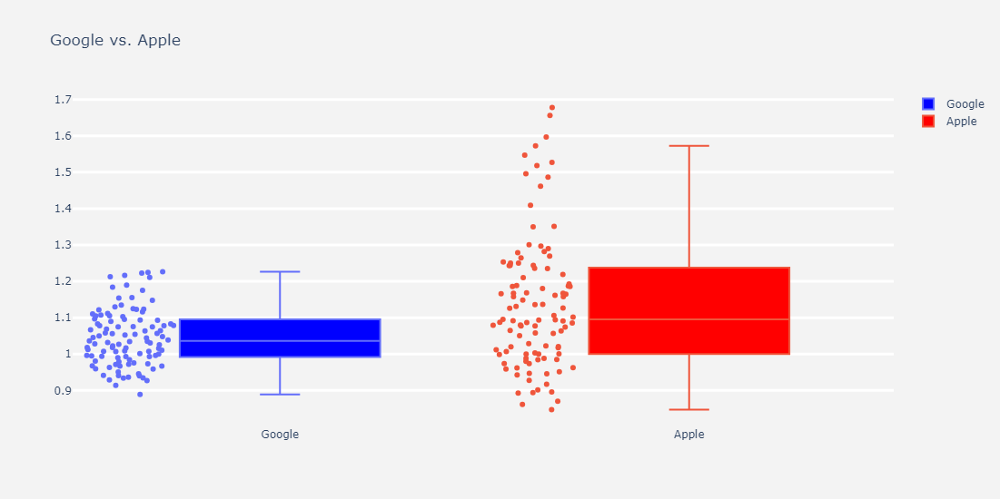

In [96]:
# Complex Styling
df_stocks = px.data.stocks()
fig = go.Figure()
# Show all points, spread them so they don't overlap and change whisker width
fig.add_trace(go.Box(y=df_stocks.GOOG, boxpoints='all', name='Google',
                    fillcolor='blue', jitter=0.5, whiskerwidth=0.2))
fig.add_trace(go.Box(y=df_stocks.AAPL, boxpoints='all', name='Apple',
                    fillcolor='red', jitter=0.5, whiskerwidth=0.2))
# Change background / grid colors
fig.update_layout(title='Google vs. Apple', 
                  yaxis=dict(gridcolor='rgb(255, 255, 255)',
                 gridwidth=3),
                 paper_bgcolor='rgb(243, 243, 243)',
                 plot_bgcolor='rgb(243, 243, 243)')
fig.update_layout(width=800,height=550)

## Violin Plots
A violin plot is a method of plotting numerical data and represents a probability density of the data at different values. It is similar to a box plot in that it provides information about the distribution of the data, but it also includes a rotated kernel density plot on each side.

Here's what the components of a violin plot represent:

Kernel Density Estimation (KDE) Plot: The central part of a violin plot is a kernel density estimation plot, which represents the distribution of the data at different values along the numerical axis. This plot is mirrored on both sides of the central axis.

Box Plot: A box plot is often superimposed inside the violin plot. It shows the median, quartiles, and potential outliers of the data, providing additional information about the distribution's central tendency and spread.

Violin plots are particularly useful when you want to visualize the distribution of data across multiple groups or categories. They provide a more informative representation of the data's distribution compared to traditional box plots, especially when dealing with multimodal or skewed distributions.

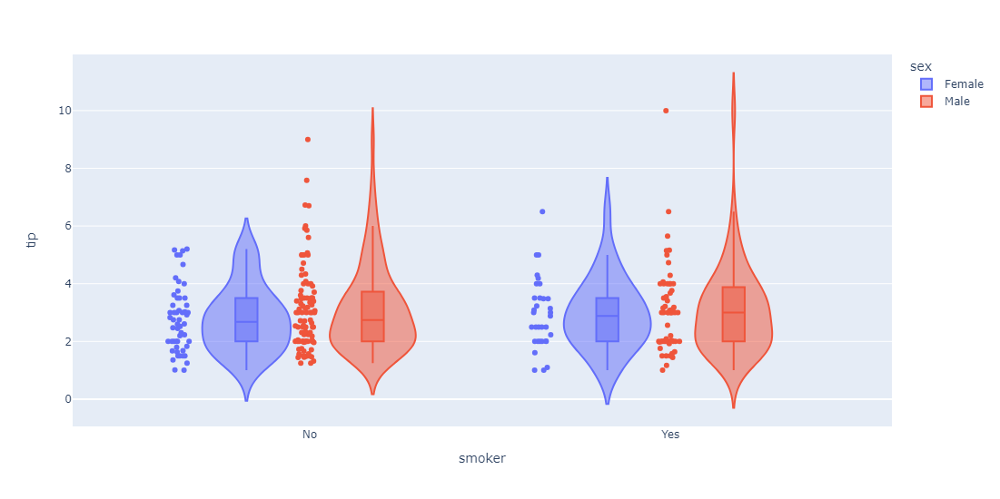

In [9]:
# Violin Plot is a combination of the boxplot and KDE
# While a box plot corresponds to data points, the violin plot uses the KDE estimation of the data points
df_tips = px.data.tips()
fig= px.violin(df_tips, y="tip", x="smoker", color="sex", box=True, points="all",
          hover_data=df_tips.columns)
fig.update_layout(width=800,height=550)

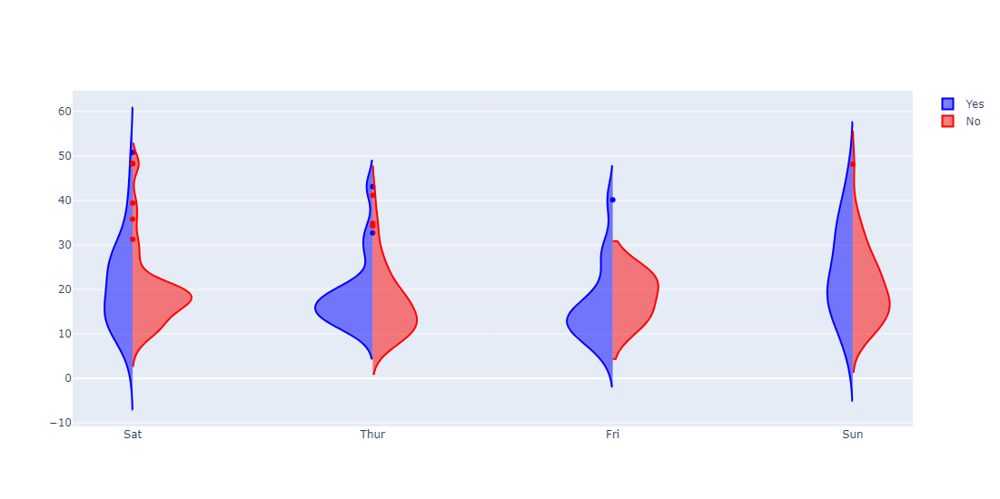

In [99]:
# Morph left and right sides based on if the customer smokes
fig = go.Figure()
fig.add_trace(go.Violin(x=df_tips['day'][ df_tips['smoker'] == 'Yes' ],
                        y=df_tips['total_bill'][ df_tips['smoker'] == 'Yes' ],
                        legendgroup='Yes', scalegroup='Yes', name='Yes',
                        side='negative',
                        line_color='blue'))
fig.add_trace(go.Violin(x=df_tips['day'][ df_tips['smoker'] == 'No' ],
                        y=df_tips['total_bill'][ df_tips['smoker'] == 'No' ],
                        legendgroup='Yes', scalegroup='Yes', name='No',
                        side='positive',
                        line_color='red'))
fig.update_layout(width=800,height=550)

## Density Heatmaps

In [100]:
# Create a heatmap using Seaborn data
flights = sns.load_dataset("flights")
flights

,year,month,passengers
0,1949,Jan,112
1,1949,Feb,118
2,1949,Mar,132
3,1949,Apr,129
4,1949,May,121
...,...,...,...
139,1960,Aug,606
140,1960,Sep,508
141,1960,Oct,461
142,1960,Nov,390


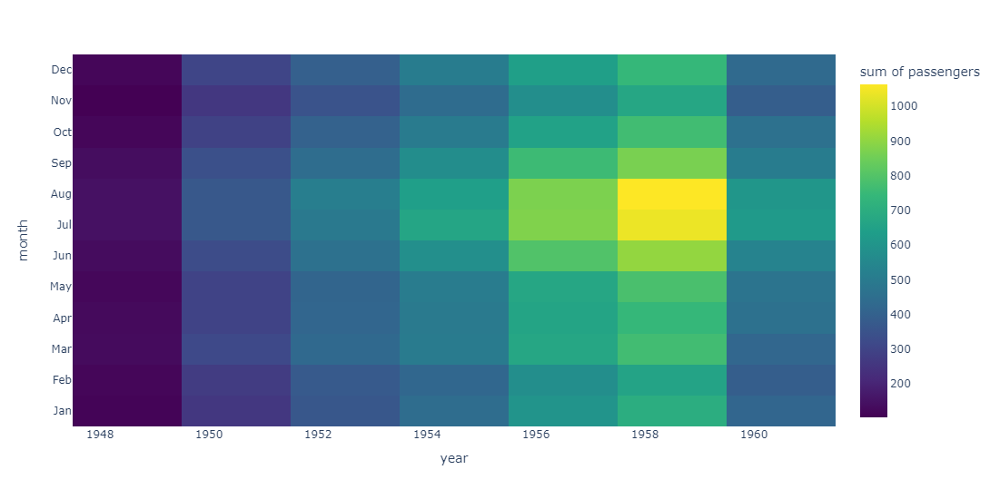

In [101]:
# You can set bins with nbinsx and nbinsy
fig = px.density_heatmap(flights, x='year', y='month', z='passengers', 
                         color_continuous_scale="Viridis")
fig.update_layout(width=800,height=550)

## 3D Scatter Plots

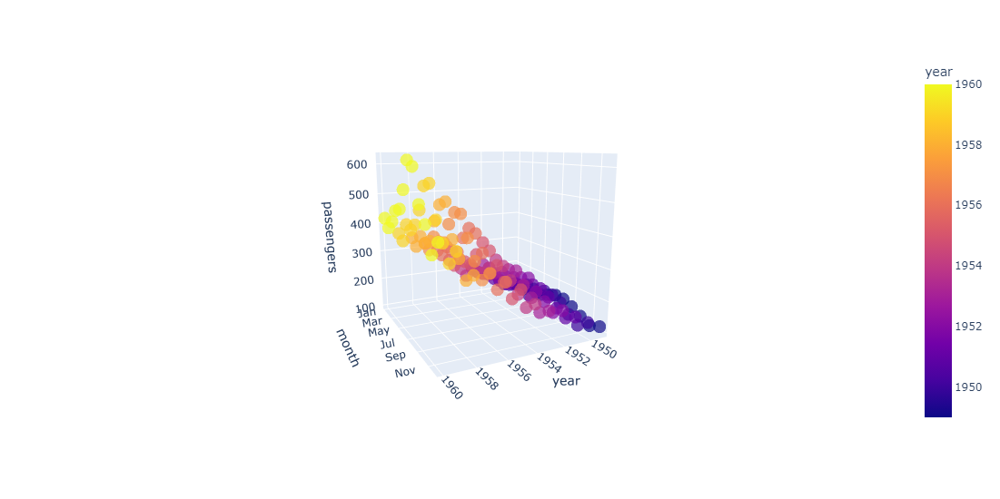

In [104]:
# Create a 3D scatter plot using flight data
fig = px.scatter_3d(flights, x='year', y='month', z='passengers', color='year',
                   opacity=0.7, width=800, height=550)
fig

## 3D Line Plots

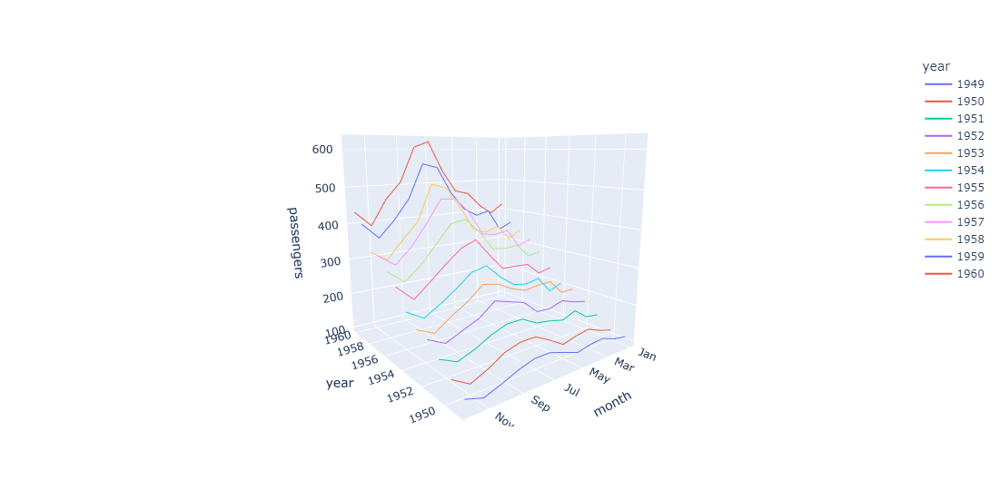

In [105]:
fig = px.line_3d(flights, x='year', y='month', z='passengers', color='year', width=800, height=550)
fig

## Scatter Matrix
A scatter matrix, also known as a pairs plot or a scatterplot matrix, is a type of plot that displays multiple scatterplots arranged in a grid format. It is used to visualize the pairwise relationships between multiple variables in a dataset. Each scatterplot in the matrix represents the relationship between two variables, and the matrix as a whole provides a comprehensive view of all pairwise relationships.

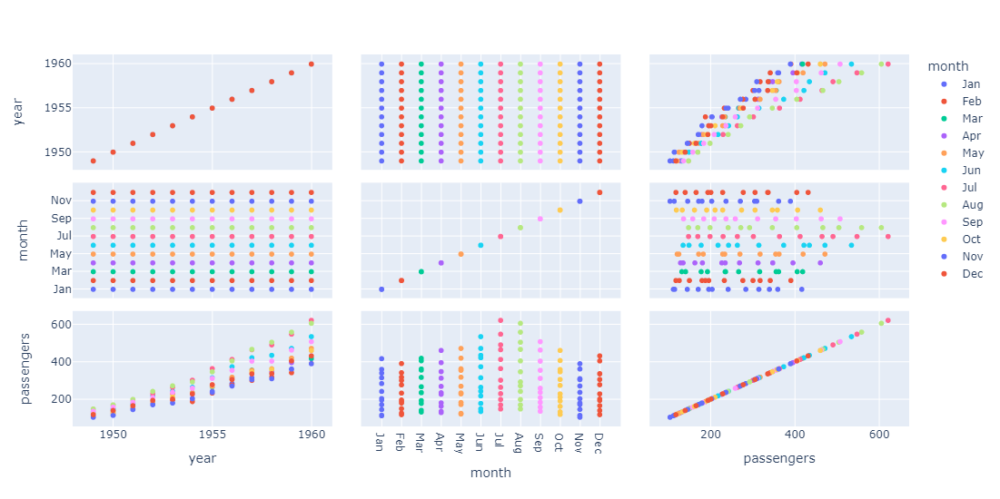

In [107]:
# With a scatter matrix we can compare changes when comparing column data
fig= px.scatter_matrix(flights, color='month', width=800, height=550)
fig

## Map Scatter Plots

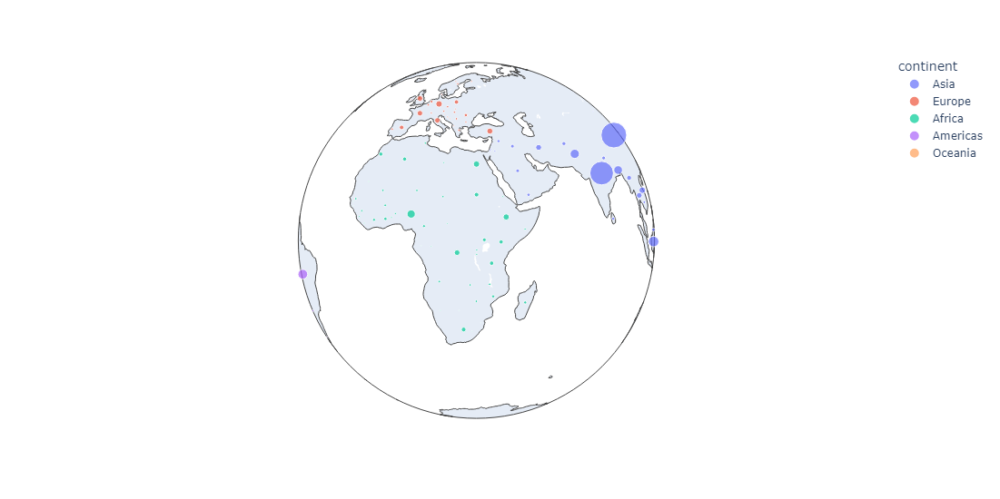

In [110]:
# There are many interesting ways of working with maps
# plotly.com/python-api-reference/generated/plotly.express.scatter_geo.html
df = px.data.gapminder().query("year == 2007")
fig = px.scatter_geo(df, locations="iso_alpha",
                     color="continent", # which column to use to set the color of markers
                     hover_name="country", # column added to hover information
                     size="pop", # size of markers
                     projection="orthographic")
fig.update_layout(width=800,height=550)

## Polar Charts

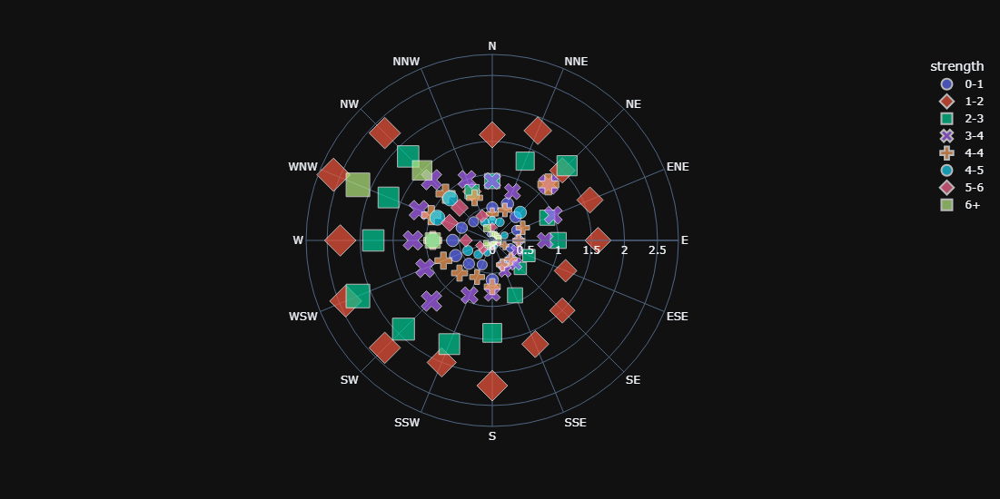

In [8]:
# Polar charts display data radially 
# Let's plot wind data based on direction and frequency
# You can change size and auto-generate different symbols as well
df_wind = px.data.wind()
fig= px.scatter_polar(df_wind, r="frequency", theta="direction", color="strength",
                size="frequency", symbol="strength", template="plotly_dark")

fig.update_layout(width=800,height=550)

## Ternary Plots

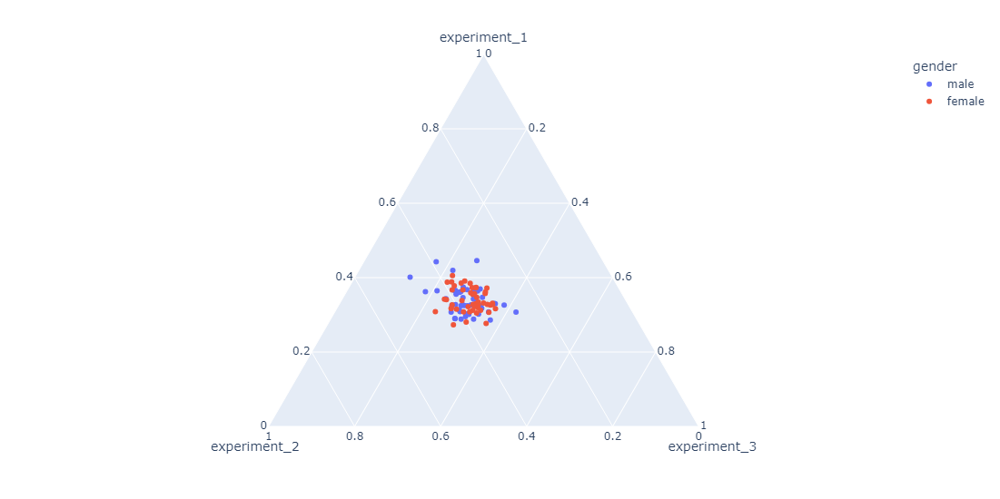

In [120]:
# Used to represent ratios of 3 variables
df_exp = px.data.experiment()
fig= px.scatter_ternary(df_exp, a="experiment_1", b="experiment_2", 
                   c='experiment_3', hover_name="group", color="gender")
fig.update_layout(width=800,height=550)

## Facets

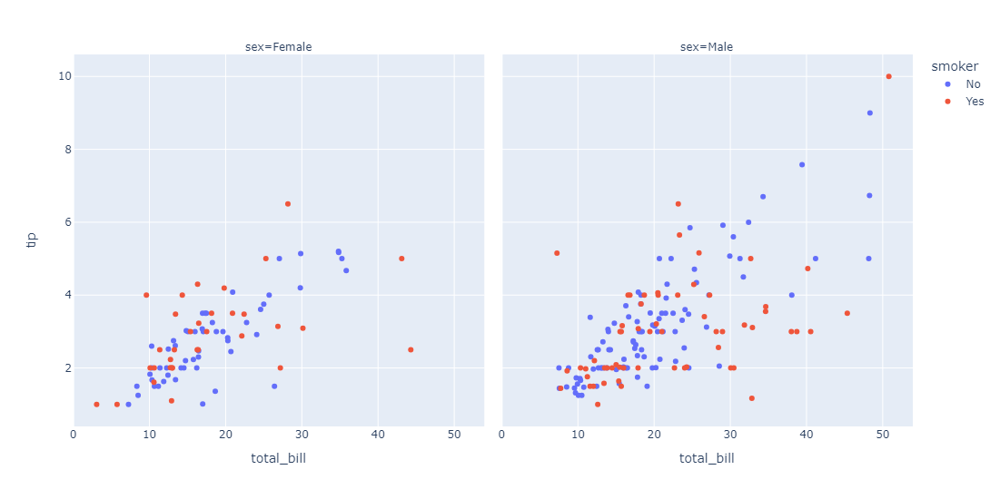

In [121]:
# You can create numerous subplots
df_tips = px.data.tips()
fig= px.scatter(df_tips, x="total_bill", y="tip", color="smoker", facet_col="sex")
fig.update_layout(width=800,height=550)

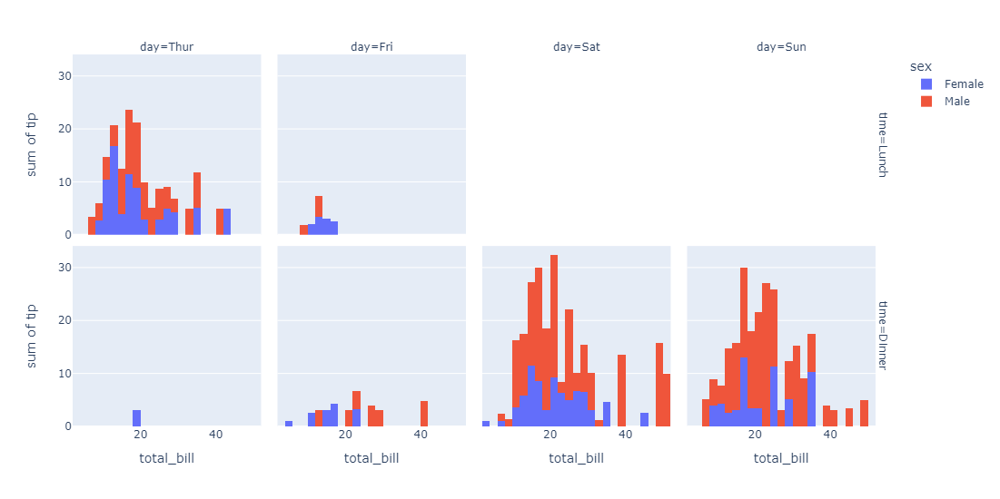

In [122]:
# We can line up data in rows and columns
fig= px.histogram(df_tips, x="total_bill", y="tip", color="sex", facet_row="time", facet_col="day",
       category_orders={"day": ["Thur", "Fri", "Sat", "Sun"], "time": ["Lunch", "Dinner"]})

fig.update_layout(width=800,height=550)

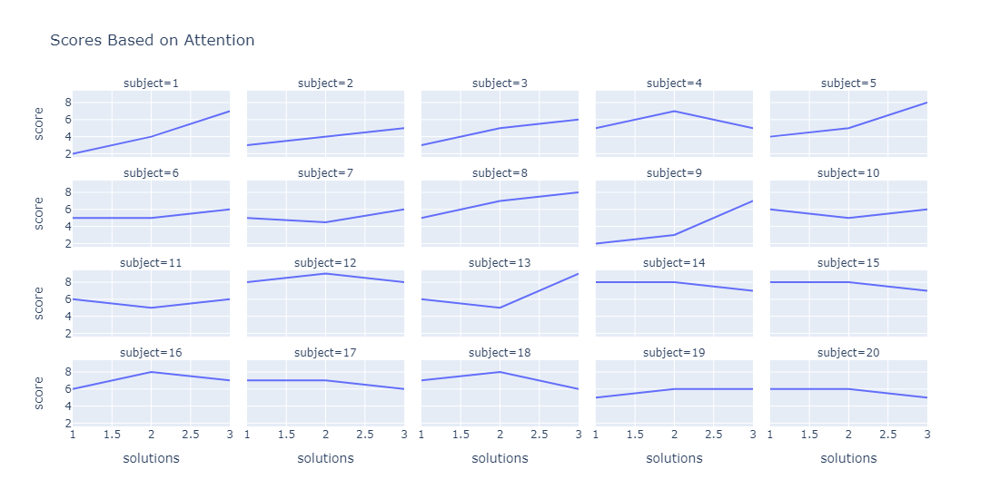

In [123]:
# This dataframe provides scores for different students based on the level of attention they could provide during testing

att_df = sns.load_dataset("attention")
fig = px.line(att_df, x='solutions', y='score', facet_col='subject',
             facet_col_wrap=5, title='Scores Based on Attention')
fig.update_layout(width=800,height=550)

## Animated Plots

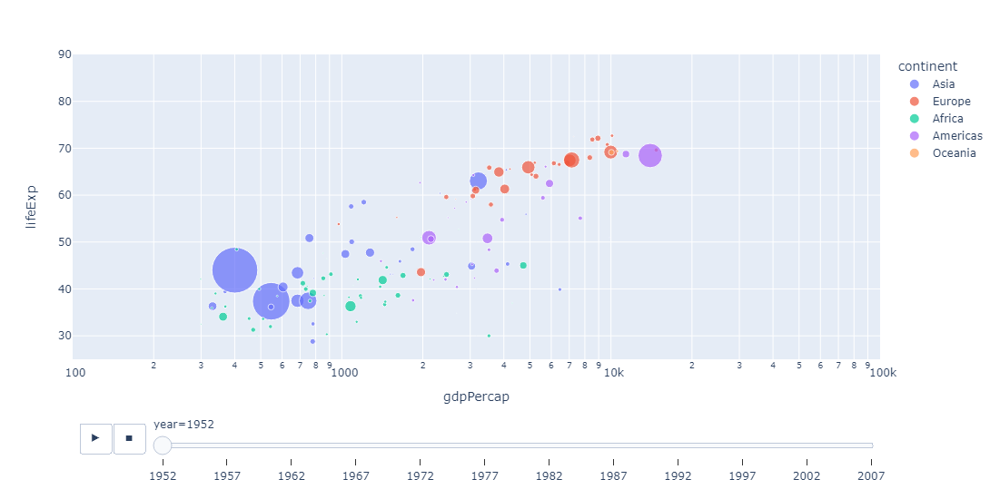

In [124]:
# Create an animated plot that you can use to cycle through continent GDP & life expectancy changes

df_cnt = px.data.gapminder()
fig= px.scatter(df_cnt, x="gdpPercap", y="lifeExp", animation_frame="year", 
           animation_group="country",
           size="pop", color="continent", hover_name="country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])

fig.update_layout(width=800,height=550)

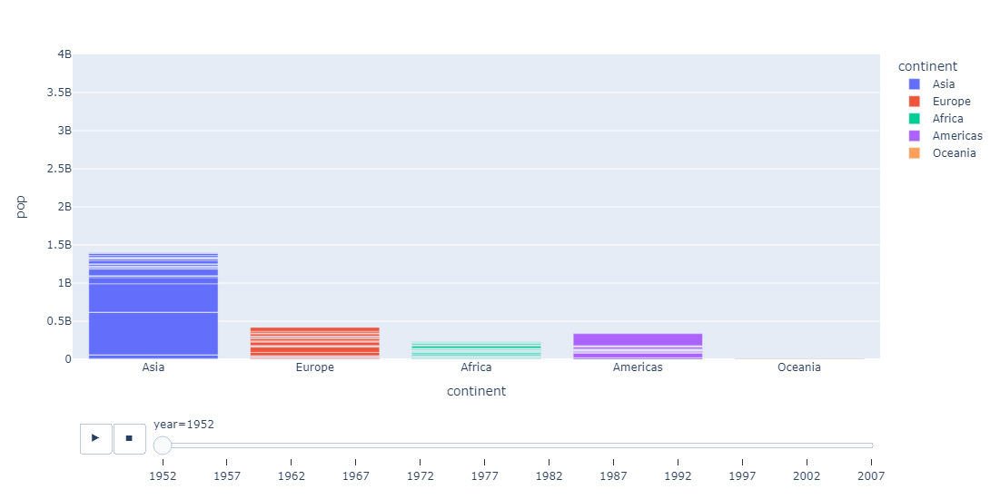

In [125]:
# Watch as bars chart population changes
fig= px.bar(df_cnt, x="continent", y="pop", color="continent",
  animation_frame="year", animation_group="country", range_y=[0,4000000000])

fig.update_layout(width=800,height=550)